## Data preprocessing

In [1]:
##############################
####  Importing XES files  ###
##############################
import os
import pm4py
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.util import constants
import pandas as pd
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.algo.conformance.tokenreplay import algorithm as token_replay
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.visualization.petri_net import visualizer as pn_visualizer
import matplotlib.pyplot as plt
from pm4py.visualization.process_tree import visualizer as pt_visualizer

In [2]:
df = pd.read_csv('incidentProcess_custom.csv', sep='\t')
df = df.sort_values(['Incident ID', 'ActivityTimeStamp']) # Sort by Incident ID and ActivityTimeStamp to ensure correct order

datetime_columns = ['Open Time', 'Reopen Time', 'Resolved Time', 'Close Time']

df['Handle Time (Hours)'] = df['Handle Time (Hours)'].str.replace(',', '.').astype(float)
df['ActivityTimeStamp'] = pd.to_datetime(df['ActivityTimeStamp'])


# Convert each column to datetime and reformat
for col in datetime_columns:
    # Parse as datetime with day-first format (dd/mm/yyyy)
    df[col] = pd.to_datetime(df[col], dayfirst=True)
    
    # Convert to desired string format (if needed for export YYYY-MM-DD HH:MM:SS)
    df[col] = df[col].dt.strftime('%Y-%m-%d %H:%M:%S')

df['Open Time'] = pd.to_datetime(df['Open Time'])
df['Reopen Time'] = pd.to_datetime(df['Reopen Time'])
df['Resolved Time'] = pd.to_datetime(df['Resolved Time'])
df['Close Time'] = pd.to_datetime(df['Close Time'])
df['duration_hours'] = (df['Close Time'] - df['Open Time']) / pd.Timedelta(hours=1)


# Calculate time between consecutive activities within a case
df['WaitingTime'] = df.groupby('Incident ID')['ActivityTimeStamp'].diff().dt.total_seconds() / 3600

# Shift activity to get "from-to" pairs
df['FromActivity'] = df.groupby('Incident ID')['Activity'].shift(1)
df['ToActivity'] = df['Activity']

df.columns = df.columns.str.replace(" ", "_")

# The number of times an incident changed Assignment_Group.
df['Prev_Assignment_Group'] = df.groupby('Incident_ID')['Assignment_Group'].shift(1)
df['Cross_Team'] = df['Assignment_Group'] != df['Prev_Assignment_Group']
df['Cross_Team'] = df['Cross_Team'].fillna(False)

## Check the distribution of the data

In [3]:
bins = [-1, 0, 1, 2, 3, 4, float('inf')]
labels = ['0', '1', '2', '3', '4', '>=5']

df_copy = df[['Incident_ID','duration_hours','Number_of_Reassignments']].drop_duplicates()
df_copy['num_reassignments'] = pd.cut(
    df_copy['Number_of_Reassignments'],
    bins=bins,
    labels=labels
)


result = (
    df_copy
    .groupby('num_reassignments')
    .agg(
        n_cases=('Incident_ID', 'nunique'),
        avg_aht=('duration_hours', 'mean')
    )
    .reset_index()
)

result['avg_aht'] = result['avg_aht'].round(1)
print(result)

  num_reassignments  n_cases  avg_aht
0                 0    27468     39.4
1                 1     7267    114.3
2                 2     5376    192.3
3                 3     2191    266.5
4                 4     1605    335.1
5               >=5     2693    619.4


/var/folders/ff/k18nhm5d3vg1wp021t0hhw900000gn/T/ipykernel_57733/1021960352.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('num_reassignments')


### Build a new table to show the overall performance of each case

In [4]:
# The total number of unique Assignment_Group values an incident had.
distinct_groups = df.groupby('Incident_ID')['Assignment_Group'].nunique().reset_index()
distinct_groups.columns = ['Incident_ID', 'Num_Distinct_Teams']

case_durations = df.groupby('Incident_ID').agg({
    'duration_hours': 'first',  # duration is the same across rows of the same case
    'Priority': 'first' , # control variable
    'Number_of_Reassignments': 'first'  # handle time is the same across rows of the same case
}).reset_index()

analysis_df = case_durations.merge(distinct_groups, on='Incident_ID')

def bucketize(h):
    return str(h) if h < 5 else '5+'

analysis_df['Num_Reassignments_Cat'] = analysis_df['Number_of_Reassignments'].apply(bucketize)
analysis_df['Num_Distinct_Teams_Cat'] = analysis_df['Num_Distinct_Teams'].apply(bucketize)

In [5]:
analysis_df

,Incident_ID,duration_hours,Priority,Number_of_Reassignments,Num_Distinct_Teams,Num_Reassignments_Cat,Num_Distinct_Teams_Cat
0,IM0000004,15312.305556,4,26.0,3,5+,3
1,IM0000005,15116.866944,3,33.0,4,5+,4
2,IM0000006,15722.619444,3,3.0,1,3.0,1
3,IM0000011,11637.706667,4,13.0,4,5+,4
4,IM0000012,10922.903333,4,2.0,2,2.0,2
...,...,...,...,...,...,...,...
46596,IM0047053,0.095000,4,0.0,2,0.0,2
46597,IM0047054,0.428333,4,0.0,2,0.0,2
46598,IM0047055,0.071667,5,0.0,1,0.0,1
46599,IM0047056,0.116944,4,0.0,2,0.0,2


In [6]:
summary = analysis_df.groupby('Num_Reassignments_Cat')['duration_hours'].describe(percentiles=[.25, .5, .75])

total_count = summary['count'].sum()
summary['count_percentage'] = summary['count'] / total_count

summary = summary[['mean','std','min','max','25%', '50%', '75%', 'count', 'count_percentage']]
summary

,mean,std,min,max,25%,50%,75%,count,count_percentage
Num_Reassignments_Cat,,,,,,,,,
0.0,39.414823,132.270553,0.005833,6359.806111,0.653889,2.522083,23.519583,27468.0,0.589429
1.0,114.339029,366.509622,0.013611,10075.858056,3.402222,24.500833,98.965139,7267.0,0.155941
2.0,192.338529,563.317983,0.029444,11972.693611,19.357153,64.885417,167.667014,5376.0,0.115362
3.0,266.523625,676.359915,0.114167,15722.619444,42.131111,118.036111,241.002222,2191.0,0.047016
4.0,335.093029,739.766119,0.389444,10922.436944,51.832500,144.581944,310.995833,1605.0,0.034441
5+,619.190860,1142.297120,0.440278,15312.305556,137.478681,284.620139,590.762083,2694.0,0.057810


In [7]:
summary = analysis_df.groupby('Num_Distinct_Teams_Cat')['duration_hours'].describe(percentiles=[.25, .5, .75])

total_count = summary['count'].sum()
summary['count_percentage'] = summary['count'] / total_count

summary = summary[['mean','std','min','max','25%', '50%', '75%', 'count', 'count_percentage']]
summary

,mean,std,min,max,25%,50%,75%,count,count_percentage
Num_Distinct_Teams_Cat,,,,,,,,,
1,61.810056,391.947557,0.005833,15722.619444,0.089722,2.725139,29.557708,3654.0,0.078410
2,61.441466,286.112005,0.020556,11972.693611,0.819444,3.443194,33.478264,28528.0,0.612176
3,174.258144,487.691807,0.052778,15312.305556,15.772917,49.724167,164.874583,9215.0,0.197743
4,309.349523,756.088225,0.239444,15116.866944,44.425903,121.821389,284.300972,3308.0,0.070986
5+,595.814700,999.094027,0.837500,9039.641944,119.983194,269.733333,595.304722,1896.0,0.040686


## DFG <span style="color:red"> useless, worse than Disco </span>

In [8]:
from pm4py.objects.log.util import dataframe_utils
from pm4py.objects.conversion.log import converter as log_converter

df_pm4py = df.rename(columns={
    'Incident_ID': 'case:concept:name',
    'Activity': 'concept:name',
    'ActivityTimeStamp': 'time:timestamp'
})

df_pm4py['time:timestamp'] = pd.to_datetime(df_pm4py['time:timestamp'])
df_pm4py = df_pm4py.merge(analysis_df, how='left', left_on='case:concept:name', right_on='Incident_ID')
cols_to_drop = ['Incident_ID', 'duration_hours_y', 'Priority_y', 'Number_of_Reassignments_y']
df_pm4py = df_pm4py.drop(columns=cols_to_drop)
df_pm4py = dataframe_utils.convert_timestamp_columns_in_df(df_pm4py)
log = log_converter.apply(df_pm4py)

In [9]:
df_pm4py.to_csv('project_log.csv', sep='\t', index=False)

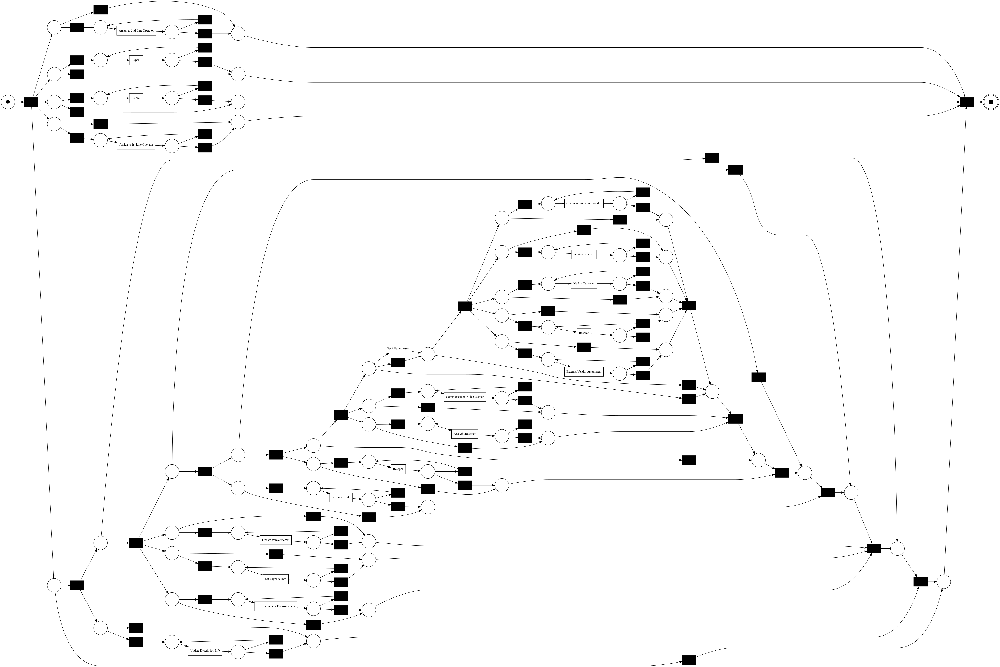

In [10]:
parameters ={
constants.PARAMETER_CONSTANT_CASEID_KEY: "case:concept:name",
constants.PARAMETER_CONSTANT_ACTIVITY_KEY: "concept:name",
constants.PARAMETER_CONSTANT_TIMESTAMP_KEY: "time:timestamp"}
im_tree = inductive_miner.apply(log, parameters=parameters)

tree = inductive_miner.apply(log)
net, initial_marking, final_marking = pt_converter.apply(tree, variant=pt_converter.Variants.TO_PETRI_NET)
gviz = pn_visualizer.apply(net, initial_marking, final_marking)

pn_visualizer.view(gviz)
# pn_visualizer.save(gviz, './inductive_miner_pn.png')

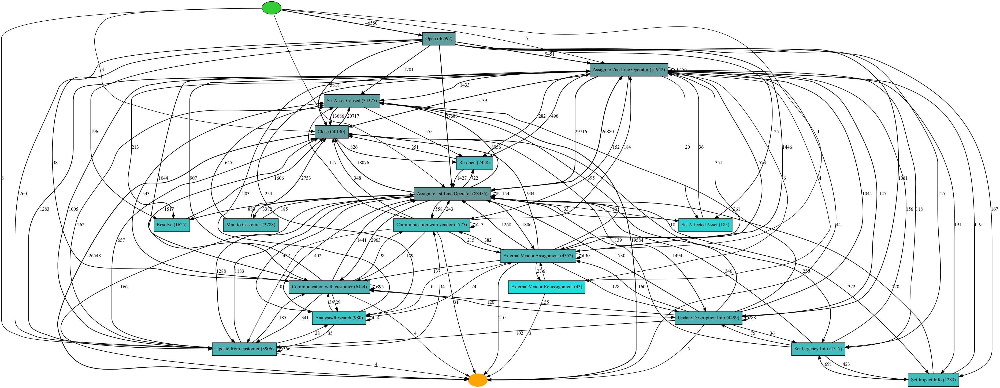

In [11]:
heu_net = pm4py.discover_heuristics_net(log, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

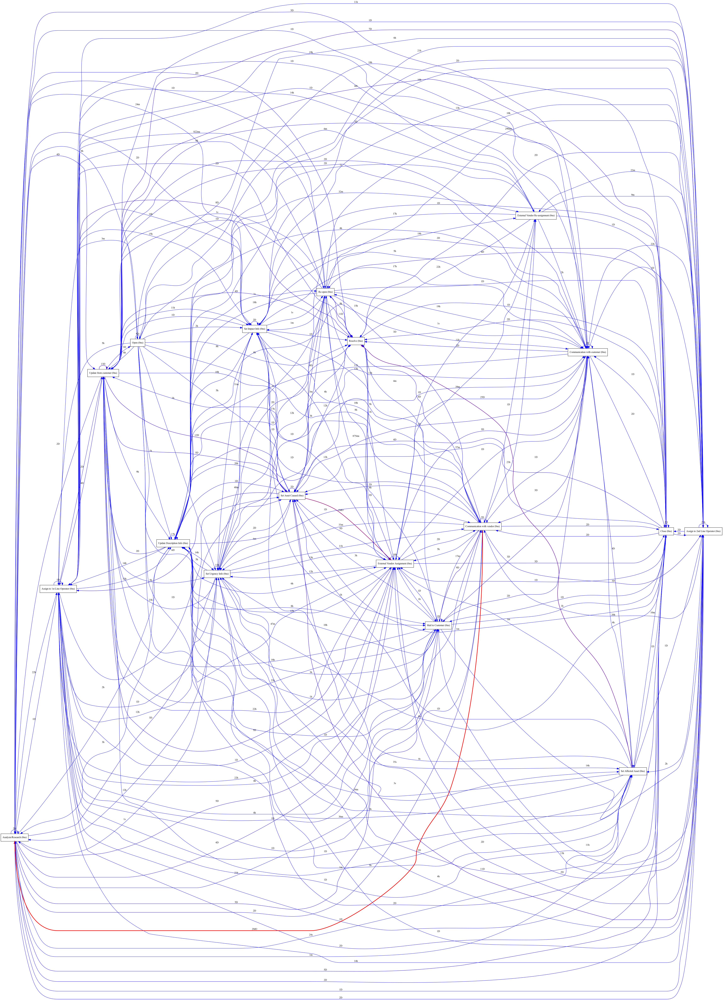

In [12]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization

dfg_perf = dfg_discovery.apply(log, variant=dfg_discovery.Variants.PERFORMANCE)

parameters = {
    "format": "png",
    "bg_color": "white",
    "fontsize": 12
}

gviz = dfg_visualization.apply(dfg_perf, log=log, variant=dfg_visualization.Variants.PERFORMANCE, parameters=parameters)
dfg_visualization.view(gviz)

In [ ]:
import collections
import graphviz

# From→To→Case
transitions = []

for case_id, group in df_pm4py.groupby('case:concept:name'):
    group = group.sort_values('time:timestamp')
    activities = list(group['concept:name'])
    for i in range(len(activities) - 1):
        from_act = activities[i]
        to_act = activities[i+1]
        num_teams = group['Num_Distinct_Teams'].iloc[0]
        transitions.append(((from_act, to_act), num_teams))

# Create a dictionary to store the team counts for each edge
edge_team_counts = collections.defaultdict(list)
for (edge, num_teams) in transitions:
    edge_team_counts[edge].append(num_teams)

# Calculate the average number of teams for each edge
avg_team_counts = {edge: round(sum(v)/len(v), 2) for edge, v in edge_team_counts.items()}

# Calculate average waiting time for each edge
avg_wait_hours = {k: round(v / 3600, 2) for k, v in dfg_perf.items()}

custom_edge_labels = {}
for edge in avg_wait_hours:
    wait = avg_wait_hours[edge]
    teams = avg_team_counts.get(edge, 0)
    custom_edge_labels[edge] = f"{wait}h / {teams} teams"


dot = graphviz.Digraph(format='png')
dot.attr(bgcolor='white', fontsize='12', rankdir='LR')


activities = set()
for (a1, a2) in avg_wait_hours.keys():
    activities.add(a1)
    activities.add(a2)

for act in activities:
    dot.node(act)

# Add edges with custom labels
for (a1, a2), label in custom_edge_labels.items():
    dot.edge(a1, a2, label=label)

dot.render('custom_dfg', view=True)

'custom_dfg.png'